In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tweepy# Tweepy is an open source Python package that gives you a very convenient way to access the Twitter API with Python
import pickle ## serialize and desearilize python object . in short helps in storing the data 
from tweepy import OAuthHandler
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
import re
import nltk # Natural Language ToolKit, for stopping, stemming, lemmatization
nltk.download('punkt') # default download
nltk.download('stopwords') # downloading the stopwords to be used in the stopping process
nltk.download('wordnet') # downloading wordnet(is like imagenet for text) text data for stemming and lemmatization purpose
from nltk.corpus import stopwords # imports the stopwords we can use
from nltk.stem.wordnet import WordNetLemmatizer # Lemmatizer
from textblob import TextBlob ## for classifying data as positive or negative tweet 
from wordcloud import WordCloud # visualizing tweets  

[nltk_data] Downloading package punkt to C:\Users\Rohit
[nltk_data]     Charaya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Rohit
[nltk_data]     Charaya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Rohit
[nltk_data]     Charaya\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:

consumer_key="N6sv1PFcA3fetcd9Ib32CNaiH"
consumer_secret="CKfuAaHbXlVsCjgZQzu2EMeMaQm9rxGyNlBRRIzWaHuoPxODmt"
access_token="1375433630973980675-RcHEJm0CVgmcyOuxwDDEnzA6OPDgBG"
access_token_secret="gbwlaZfOae13oPjex7CH1Yy1BIi32t70OH9Nde6JkqPTJ"


In [4]:
auth = tweepy.OAuthHandler( consumer_key , consumer_secret )
auth.set_access_token( access_token , access_token_secret )
api = tweepy.API(auth)

In [5]:
df_amazon = pd.DataFrame(columns=["Tweet"])
df_flipkart = pd.DataFrame(columns=["Tweet"])
df_snapdeal =  pd.DataFrame(columns=["Tweet"])

# Extracting tweets of Amazon, Flipkart and Snapdeal

#### Extracting tweets for Amazon

In [201]:
def get_tweets(Topic,Count):    
    i=0
    for tweet in tweepy.Cursor(api.search, q=Topic,count=3000, lang="en",exclude='retweets').items():
        print(i, end='\r')
        df_amazon.loc[i,"Tweet"] = tweet.text
        df_amazon.to_csv("AmazonDataset.csv",index=False)
        i=i+1
        if i>Count:
            break
        else:
            pass
topic = ['Amazon India']
get_tweets(topic,Count=3000)

#### Extracting tweets for flipkart

In [215]:
def get_tweets(Topic,Count):    
    i=0
    for tweet in tweepy.Cursor(api.search, q=Topic,count=3000, lang="en",exclude='retweets').items():
        print(i, end='\r')
        df_flipkart.loc[i,"Tweet"] = tweet.text
        df_flipkart.to_csv("Flipkart.csv",index=False)
        #df.to_excel('{}.xlsx'.format("TweetDataset"),index=False)   ## Save as Excel
        i=i+1
        if i>Count:
            break
        else:
            pass
topic = ['Flipkart']
get_tweets(topic,Count=3000)

#### Extracting tweets for snapdeal

In [216]:
def get_tweets(Topic,Count):    
    i=0
    for tweet in tweepy.Cursor(api.search, q=Topic,count=3000, lang="en",exclude='retweets').items():
        print(i, end='\r')
        df_snapdeal.loc[i,"Tweet"] = tweet.text
        df_snapdeal.to_csv("Snapdeal.csv",index=False)
        #df.to_excel('{}.xlsx'.format("TweetDataset"),index=False)   ## Save as Excel
        i=i+1
        if i>Count:
            break
        else:
            pass
topic = ['Snapdeal']
get_tweets(topic,Count=3000)

##### The standard API of twitter allows tweet extraction of last 7 days. As there were only 444 tweets on snapdeal in last 7 days, therefore we have done our analysis on 444 tweets 

# Analyzing tweets of Flipkart

In [289]:
df_flipkart=pd.read_csv('Flipkart.csv')

In [290]:
df_flipkart.shape

(3001, 1)

In [291]:
df_flipkart.columns

Index(['Tweet'], dtype='object')

# Cleaning the text

In [ ]:
# Let’s proceed with our processing of the text. We’ll apply the following steps one by one:
transform tweet text into lowercase
remove twitter handles
remove hyperlinks
remove non-alphanumeric characters such as punctuation marks
remove whitespace

In [6]:
def cleantext(text): 
    text=text.strip().lower()
    text=re.sub(r'@[A-Za-z0-9]+','',text) #remove @ mentions 
    text=re.sub(r'#','',text) # remove hashtags 
    text=re.sub(r'RT[\s]+','',text)# remove the retweets 
    text=re.sub(r'(http\S+)','',text)  # removethe hyper link 
    text=re.sub('([^0-9a-z \t])',' ',text)# remove the punctuations 
    return text

In [293]:
df_flipkart.drop_duplicates(inplace=True) # Removing the duplicates

In [294]:
df_flipkart.shape
# out of 3000, only 2947 left after removing duplicacy

(2947, 1)

In [295]:
df_flipkart['tidy_tweet'] =df_flipkart['Tweet'].apply(cleantext)

In [296]:
df_flipkart

,Tweet,tidy_tweet
0,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI requested for the manager and they shouted and being rude… https://t.co/gfyiX2aipk,kalyan k i requested for the manager and they shouted and being rude
1,@Flipkart My issue is still not being addressed by your team its been over a week now. Please help.,my issue is still not being addressed by your team its been over a week now please help
2,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI already spoke with the bank and the bank said there is not… https://t.co/1EG7M0tIb3,kalyan k i already spoke with the bank and the bank said there is not
3,"@realmeIndia @realmecareIN \nThe photos looks like blurry, not focus on the photos.\nSo sad with it. \nI ordered it fr… https://t.co/zW4ftk5Osn",the photos looks like blurry not focus on the photos so sad with it i ordered it fr
4,"@AMANKUMAR_1234 As this is a public forum, please do not share your personal details like phone number, email addre… https://t.co/d7VwohHFOS",1234 as this is a public forum please do not share your personal details like phone number email addre
5,@manukumarjain @RedmiIndia stop flash sale and start open sale in #Amazon. #RedmiNote10 #RedmiNote10ProMax are sel… https://t.co/BPGx8B8r3m,stop flash sale and start open sale in amazon redminote10 redminote10promax are sel
6,"@PrinceK93811123 We'd like to assist you further. As requested earlier, help us with your order ID so that we can h… https://t.co/dbo6ygURsO",we d like to assist you further as requested earlier help us with your order id so that we can h
7,"@ankitnahar88 Also, we'd like to tell you, please do not reveal Flipkart account details here. You can just DM us b… https://t.co/mUFJ2i9QeN",also we d like to tell you please do not reveal flipkart account details here you can just dm us b
8,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI have sent the first email on this issue on 3rd Feb. Today… https://t.co/udRFvzC6gR,kalyan k i have sent the first email on this issue on 3rd feb today
9,@Vivo_India @TrakinTech @RajivMakhni @mysmartprice @TechnicalGuruji @tech_burner @TheUnbiasedBlog @ZEISSLenses Does… https://t.co/kNp5hGNtPA,india burner does


In [7]:
## Applying lemmatization, stopping and tokenization
wordnet_lemmatizer = WordNetLemmatizer()
def final_clean(text):
    text=text.split() # tokenization
    text= [w for w in text if not w in stopwords.words('english')] # stopping 
    text= [wordnet_lemmatizer.lemmatize(w,'v') for w in text] # lemmatization
    return text
    
    

In [298]:
df_flipkart['tidy_tweet'] =df_flipkart['tidy_tweet'].apply(final_clean)

In [299]:
df_flipkart['tidy_tweet'] = df_flipkart['tidy_tweet'].apply(lambda x: ' '.join([w for w in x]))

In [300]:
df_flipkart.head(5)

,Tweet,tidy_tweet
0,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI requested for the manager and they shouted and being rude… https://t.co/gfyiX2aipk,kalyan k request manager shout rude
1,@Flipkart My issue is still not being addressed by your team its been over a week now. Please help.,issue still address team week please help
2,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI already spoke with the bank and the bank said there is not… https://t.co/1EG7M0tIb3,kalyan k already speak bank bank say
3,"@realmeIndia @realmecareIN \nThe photos looks like blurry, not focus on the photos.\nSo sad with it. \nI ordered it fr… https://t.co/zW4ftk5Osn",photos look like blurry focus photos sad order fr
4,"@AMANKUMAR_1234 As this is a public forum, please do not share your personal details like phone number, email addre… https://t.co/d7VwohHFOS",1234 public forum please share personal detail like phone number email addre


In [301]:
# Create a function to get the subjectivity 
def getsubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

# create a function to get the polarity
def getpolarity(text):
    return TextBlob(text).sentiment.polarity

# Create two new columns 
df_flipkart['Subjectivity']=df_flipkart['tidy_tweet'].apply(getsubjectivity)
df_flipkart['Polarity']=df_flipkart['tidy_tweet'].apply(getpolarity)
# show the data frame with new columns 
df_flipkart

,Tweet,tidy_tweet,Subjectivity,Polarity
0,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI requested for the manager and they shouted and being rude… https://t.co/gfyiX2aipk,kalyan k request manager shout rude,0.600000,-3.000000e-01
1,@Flipkart My issue is still not being addressed by your team its been over a week now. Please help.,issue still address team week please help,0.000000,0.000000e+00
2,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI already spoke with the bank and the bank said there is not… https://t.co/1EG7M0tIb3,kalyan k already speak bank bank say,0.000000,0.000000e+00
3,"@realmeIndia @realmecareIN \nThe photos looks like blurry, not focus on the photos.\nSo sad with it. \nI ordered it fr… https://t.co/zW4ftk5Osn",photos look like blurry focus photos sad order fr,1.000000,-5.000000e-01
4,"@AMANKUMAR_1234 As this is a public forum, please do not share your personal details like phone number, email addre… https://t.co/d7VwohHFOS",1234 public forum please share personal detail like phone number email addre,0.183333,0.000000e+00
5,@manukumarjain @RedmiIndia stop flash sale and start open sale in #Amazon. #RedmiNote10 #RedmiNote10ProMax are sel… https://t.co/BPGx8B8r3m,stop flash sale start open sale amazon redminote10 redminote10promax sel,0.500000,0.000000e+00
6,"@PrinceK93811123 We'd like to assist you further. As requested earlier, help us with your order ID so that we can h… https://t.co/dbo6ygURsO",like assist request earlier help us order id h,0.500000,0.000000e+00
7,"@ankitnahar88 Also, we'd like to tell you, please do not reveal Flipkart account details here. You can just DM us b… https://t.co/mUFJ2i9QeN",also like tell please reveal flipkart account detail dm us b,0.000000,0.000000e+00
8,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI have sent the first email on this issue on 3rd Feb. Today… https://t.co/udRFvzC6gR,kalyan k send first email issue 3rd feb today,0.166667,1.250000e-01
9,@Vivo_India @TrakinTech @RajivMakhni @mysmartprice @TechnicalGuruji @tech_burner @TheUnbiasedBlog @ZEISSLenses Does… https://t.co/kNp5hGNtPA,india burner,0.000000,0.000000e+00


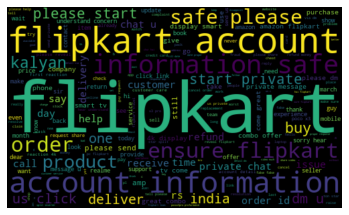

In [302]:
# Plot the word Cloud 
allwords=' '.join([i for i in df_flipkart['tidy_tweet']])
wordCloud=WordCloud(width=500,height=300,random_state=21,max_font_size=300).generate(allwords)

plt.imshow(wordCloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [303]:
# Create a function to compute the negative,neutral and positive analysis 

In [304]:
def getAnalysis(score):
    if score<0:
        return 'negative'
    elif score==0:
        return'neutral'
    else:
        return 'positive'
    
df_flipkart['analysis']=df_flipkart['Polarity'].apply(getAnalysis)
df_flipkart

,Tweet,tidy_tweet,Subjectivity,Polarity,analysis
0,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI requested for the manager and they shouted and being rude… https://t.co/gfyiX2aipk,kalyan k request manager shout rude,0.600000,-3.000000e-01,negative
1,@Flipkart My issue is still not being addressed by your team its been over a week now. Please help.,issue still address team week please help,0.000000,0.000000e+00,neutral
2,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI already spoke with the bank and the bank said there is not… https://t.co/1EG7M0tIb3,kalyan k already speak bank bank say,0.000000,0.000000e+00,neutral
3,"@realmeIndia @realmecareIN \nThe photos looks like blurry, not focus on the photos.\nSo sad with it. \nI ordered it fr… https://t.co/zW4ftk5Osn",photos look like blurry focus photos sad order fr,1.000000,-5.000000e-01,negative
4,"@AMANKUMAR_1234 As this is a public forum, please do not share your personal details like phone number, email addre… https://t.co/d7VwohHFOS",1234 public forum please share personal detail like phone number email addre,0.183333,0.000000e+00,neutral
5,@manukumarjain @RedmiIndia stop flash sale and start open sale in #Amazon. #RedmiNote10 #RedmiNote10ProMax are sel… https://t.co/BPGx8B8r3m,stop flash sale start open sale amazon redminote10 redminote10promax sel,0.500000,0.000000e+00,neutral
6,"@PrinceK93811123 We'd like to assist you further. As requested earlier, help us with your order ID so that we can h… https://t.co/dbo6ygURsO",like assist request earlier help us order id h,0.500000,0.000000e+00,neutral
7,"@ankitnahar88 Also, we'd like to tell you, please do not reveal Flipkart account details here. You can just DM us b… https://t.co/mUFJ2i9QeN",also like tell please reveal flipkart account detail dm us b,0.000000,0.000000e+00,neutral
8,@Flipkart @flipkartsupport @_Kalyan_K @rajneeeshkumar \nI have sent the first email on this issue on 3rd Feb. Today… https://t.co/udRFvzC6gR,kalyan k send first email issue 3rd feb today,0.166667,1.250000e-01,positive
9,@Vivo_India @TrakinTech @RajivMakhni @mysmartprice @TechnicalGuruji @tech_burner @TheUnbiasedBlog @ZEISSLenses Does… https://t.co/kNp5hGNtPA,india burner,0.000000,0.000000e+00,neutral


In [305]:
# print all the positive tweets 
j=1
sortedDF=df_flipkart.sort_values(by=['Polarity'])
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='positive'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1
    

1)kalyan k send first email issue 3rd feb today

2)ensure flipkart account information safe please dm us click li

3)thank patience understand ensure flipkart account information safe ple

4)kalyan k face issue flipkart executives seller many months back order mobile pho

5)airline confirm full refund still flipkart deduct cancellati

6)order guess watch worth rupees 5949 get package suggest nex

7)kalyan k big people think u live money disgust u people cheap think p

8)family please capable handle issue let bother amp involve family

9)bring india well make available buy full stock

10)ganguly suppose bottle cost less 500 rs certain sellers flipka

11)hello flipkart order lg g8x worth rs 24990 order number od2212930399

12)kalyan k order detail share via direct message fraud preventi

13)ensure flipkart account information safe please start private chat us clic

14)appropriate step would implement assist appreciate patience also

15)ensure flipkart account information safe please shar

KeyError: 437

In [306]:
j=1
sortedDF=df_flipkart.sort_values(by=['Polarity'])
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='positive'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1

1)kalyan k send first email issue 3rd feb today

2)ensure flipkart account information safe please dm us click li

3)thank patience understand ensure flipkart account information safe ple

4)kalyan k face issue flipkart executives seller many months back order mobile pho

5)airline confirm full refund still flipkart deduct cancellati

6)order guess watch worth rupees 5949 get package suggest nex

7)kalyan k big people think u live money disgust u people cheap think p

8)family please capable handle issue let bother amp involve family

9)bring india well make available buy full stock

10)ganguly suppose bottle cost less 500 rs certain sellers flipka

11)hello flipkart order lg g8x worth rs 24990 order number od2212930399

12)kalyan k order detail share via direct message fraud preventi

13)ensure flipkart account information safe please start private chat us clic

14)appropriate step would implement assist appreciate patience also

15)ensure flipkart account information safe please shar

KeyError: 437

In [308]:
# print the naegative tweets 
j=1
sortedDF=df_flipkart.sort_values(by=['Polarity'],ascending=False)
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='negative'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1

1)kalyan k request manager shout rude

2)photos look like blurry focus photos sad order fr

3)lowest hrx x wave 14r bass boost mode bluetooth headset 999

4)thing happend bro orderd poco m2pro recieved empty box phone

5)sorry understand criticality situation however request send em

6)get refund one help matter poor unprofessional

7)oli wtf use bottle school costly

8)worst service face flipkart without replacement return request close note

9)ha yar wo papa ke pas h mere mere pas m2 hi h see proof flipkart ord

10)order id od121351119040100000 want order delivery early morning 2row flipkart fail deliver today

11)flipkart flipkart mere damage refrigerator ka replacement nhi kr rhi flipkart costumer care bhi acchi respon

12)refrence name get one bed ourself since day unable sleep well

13)sorry experience understand concern relate spotify offer need update

14)sorry hear understand concern update email preferences log

15)sorry understand criticality situation however request send



KeyError: 437

In [309]:
# Get the percentage of positive tweets 
ptweets=df_flipkart[df_flipkart.analysis=='positive']
ptweets=ptweets['tidy_tweet']

round((ptweets.shape[0]/df_flipkart.shape[0])*100,1)




34.5

In [310]:
# get the percentage of negative tweets 
ntweets=df_flipkart[df_flipkart.analysis=='negative']
ntweets=ntweets['tidy_tweet']

round((ntweets.shape[0]/df_flipkart.shape[0])*100,1)



16.3

<AxesSubplot:xlabel='analysis', ylabel='count'>

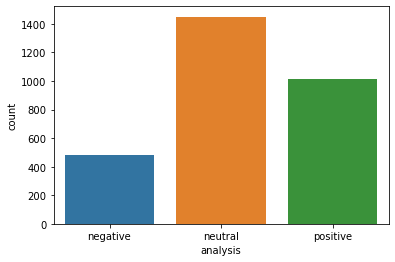

In [313]:
import seaborn as sns 
sns.countplot(x=df_flipkart['analysis'],data=df_flipkart)

# Analyzing tweets of Amazon

In [314]:
df_amazon=pd.read_csv('AmazonDataset.csv')

In [315]:
df_amazon.shape

(3001, 1)

In [316]:
df_amazon.columns

Index(['Tweet'], dtype='object')

### Cleaning the text

In [317]:
def cleantext(text): 
    text=text.strip().lower()
    text=re.sub(r'@[A-Za-z0-9]+','',text) #remove @ mentions 
    text=re.sub(r'#','',text) # remove hashtags 
    text=re.sub(r'RT[\s]+','',text)# remove the retweets 
    text=re.sub(r'(http\S+)','',text)  # removethe hyper link 
    text=re.sub('([^0-9a-z \t])',' ',text)# remove the punctuations 
    return text

In [318]:
df_amazon.drop_duplicates(inplace=True)

In [319]:
df_amazon.shape

(2985, 1)

In [320]:
df_amazon['tidy_tweet'] =df_amazon['Tweet'].apply(cleantext)

In [321]:
df_amazon

,Tweet,tidy_tweet
0,"https://t.co/ZYNoovqDnM: Online Shopping India - Buy mobiles, laptops, cameras, books, watches, apparel, shoes and… https://t.co/jNkXCHGZju",online shopping india buy mobiles laptops cameras books watches apparel shoes and
1,Book links: https://t.co/HpIjBd1XQr (US) https://t.co/Ipl4vdUupt (CA) https://t.co/vN2bG99eI2 (AU)… https://t.co/CQFhRozvrs,book links us ca au
2,Can it get any worse for Amazon in India? https://t.co/vqllzavYkX [@ZDNet],can it get any worse for amazon in india
3,https://t.co/rxsNjScju6 https://t.co/BKYCjk7eMy \n NAPA HIDE India Black Men's Wallet (NPH012 BLK) https://t.co/cQUwQ8QtXM,napa hide india black men s wallet nph012 blk
4,Deal Price: ₹ 136.73\nDiscount: ₹ 113.27 (45%)https://t.co/tss9opvEvJ,deal price 136 73 discount 113 27 45
5,The newly launched #OnePlus9Pro will go on sale in India on March 31 via Amazon. Check full details: \n\n@OnePlus_IN\n\nhttps://t.co/4KSCSYsLhK,the newly launched oneplus9pro will go on sale in india on march 31 via amazon check full details in
6,"Deal Price: ₹ 1,699.00\nDiscount: ₹ 4,300.00 (72%)https://t.co/wxtTM2lp1y",deal price 1 699 00 discount 4 300 00 72
7,Amazon Pay looks to become e-financial powerhouse in India #Amazon #WalletServices #AmazonPay #GooglePay #Paytm… https://t.co/S2PizEgyzP,amazon pay looks to become e financial powerhouse in india amazon walletservices amazonpay googlepay paytm
8,"@AmazonHelp Why should I waste my time connecting with your team, for the fault &amp; deficiency lies with you Amazon I… https://t.co/SHgaLOk0UN",why should i waste my time connecting with your team for the fault amp deficiency lies with you amazon i
9,@JeffBezos Is amazon delivering only harassment in India! Think you need to micro manage here. @amazon @AmazonHelp… https://t.co/Qm07rSRGuP,is amazon delivering only harassment in india think you need to micro manage here


In [322]:
# lemmatization, stopping, tokenization
wordnet_lemmatizer = WordNetLemmatizer()
def final_clean(text):
    text=text.split()
    text= [w for w in text if not w in stopwords.words('english')]
    text= [wordnet_lemmatizer.lemmatize(w,'v') for w in text]
    return text

In [323]:
df_amazon['tidy_tweet'] =df_amazon['tidy_tweet'].apply(final_clean)

In [324]:
df_amazon['tidy_tweet'] = df_amazon['tidy_tweet'].apply(lambda x: ' '.join([w for w in x]))

In [325]:
df_amazon.head(5)

,Tweet,tidy_tweet
0,"https://t.co/ZYNoovqDnM: Online Shopping India - Buy mobiles, laptops, cameras, books, watches, apparel, shoes and… https://t.co/jNkXCHGZju",online shop india buy mobiles laptops cameras book watch apparel shoe
1,Book links: https://t.co/HpIjBd1XQr (US) https://t.co/Ipl4vdUupt (CA) https://t.co/vN2bG99eI2 (AU)… https://t.co/CQFhRozvrs,book link us ca au
2,Can it get any worse for Amazon in India? https://t.co/vqllzavYkX [@ZDNet],get worse amazon india
3,https://t.co/rxsNjScju6 https://t.co/BKYCjk7eMy \n NAPA HIDE India Black Men's Wallet (NPH012 BLK) https://t.co/cQUwQ8QtXM,napa hide india black men wallet nph012 blk
4,Deal Price: ₹ 136.73\nDiscount: ₹ 113.27 (45%)https://t.co/tss9opvEvJ,deal price 136 73 discount 113 27 45


In [326]:
# Create a function to get the subjectivity 
def getsubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

# create a function to get the polarity
def getpolarity(text):
    return TextBlob(text).sentiment.polarity

# Create two new columns 
df_amazon['Subjectivity']=df_amazon['tidy_tweet'].apply(getsubjectivity)
df_amazon['Polarity']=df_amazon['tidy_tweet'].apply(getpolarity)
# show the data frame with new columns 
df_amazon

,Tweet,tidy_tweet,Subjectivity,Polarity
0,"https://t.co/ZYNoovqDnM: Online Shopping India - Buy mobiles, laptops, cameras, books, watches, apparel, shoes and… https://t.co/jNkXCHGZju",online shop india buy mobiles laptops cameras book watch apparel shoe,0.000000,0.000000
1,Book links: https://t.co/HpIjBd1XQr (US) https://t.co/Ipl4vdUupt (CA) https://t.co/vN2bG99eI2 (AU)… https://t.co/CQFhRozvrs,book link us ca au,0.000000,0.000000
2,Can it get any worse for Amazon in India? https://t.co/vqllzavYkX [@ZDNet],get worse amazon india,0.600000,-0.400000
3,https://t.co/rxsNjScju6 https://t.co/BKYCjk7eMy \n NAPA HIDE India Black Men's Wallet (NPH012 BLK) https://t.co/cQUwQ8QtXM,napa hide india black men wallet nph012 blk,0.433333,-0.166667
4,Deal Price: ₹ 136.73\nDiscount: ₹ 113.27 (45%)https://t.co/tss9opvEvJ,deal price 136 73 discount 113 27 45,0.000000,0.000000
5,The newly launched #OnePlus9Pro will go on sale in India on March 31 via Amazon. Check full details: \n\n@OnePlus_IN\n\nhttps://t.co/4KSCSYsLhK,newly launch oneplus9pro go sale india march 31 via amazon check full detail,0.502273,0.243182
6,"Deal Price: ₹ 1,699.00\nDiscount: ₹ 4,300.00 (72%)https://t.co/wxtTM2lp1y",deal price 1 699 00 discount 4 300 00 72,0.000000,0.000000
7,Amazon Pay looks to become e-financial powerhouse in India #Amazon #WalletServices #AmazonPay #GooglePay #Paytm… https://t.co/S2PizEgyzP,amazon pay look become e financial powerhouse india amazon walletservices amazonpay googlepay paytm,0.000000,0.000000
8,"@AmazonHelp Why should I waste my time connecting with your team, for the fault &amp; deficiency lies with you Amazon I… https://t.co/SHgaLOk0UN",waste time connect team fault amp deficiency lie amazon,0.000000,-0.200000
9,@JeffBezos Is amazon delivering only harassment in India! Think you need to micro manage here. @amazon @AmazonHelp… https://t.co/Qm07rSRGuP,amazon deliver harassment india think need micro manage,0.000000,0.000000


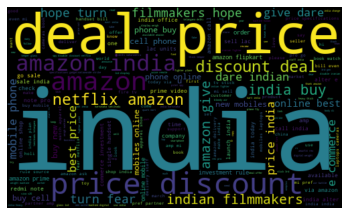

In [327]:
# Plot the word Cloud 
allwords=' '.join([i for i in df_amazon['tidy_tweet']])
wordCloud=WordCloud(width=500,height=300,random_state=21,max_font_size=300).generate(allwords)

plt.imshow(wordCloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [328]:
def getAnalysis(score):
    if score<0:
        return 'negative'
    elif score==0:
        return'neutral'
    else:
        return 'positive'
    
df_amazon['analysis']=df_amazon['Polarity'].apply(getAnalysis)
df_amazon

,Tweet,tidy_tweet,Subjectivity,Polarity,analysis
0,"https://t.co/ZYNoovqDnM: Online Shopping India - Buy mobiles, laptops, cameras, books, watches, apparel, shoes and… https://t.co/jNkXCHGZju",online shop india buy mobiles laptops cameras book watch apparel shoe,0.000000,0.000000,neutral
1,Book links: https://t.co/HpIjBd1XQr (US) https://t.co/Ipl4vdUupt (CA) https://t.co/vN2bG99eI2 (AU)… https://t.co/CQFhRozvrs,book link us ca au,0.000000,0.000000,neutral
2,Can it get any worse for Amazon in India? https://t.co/vqllzavYkX [@ZDNet],get worse amazon india,0.600000,-0.400000,negative
3,https://t.co/rxsNjScju6 https://t.co/BKYCjk7eMy \n NAPA HIDE India Black Men's Wallet (NPH012 BLK) https://t.co/cQUwQ8QtXM,napa hide india black men wallet nph012 blk,0.433333,-0.166667,negative
4,Deal Price: ₹ 136.73\nDiscount: ₹ 113.27 (45%)https://t.co/tss9opvEvJ,deal price 136 73 discount 113 27 45,0.000000,0.000000,neutral
5,The newly launched #OnePlus9Pro will go on sale in India on March 31 via Amazon. Check full details: \n\n@OnePlus_IN\n\nhttps://t.co/4KSCSYsLhK,newly launch oneplus9pro go sale india march 31 via amazon check full detail,0.502273,0.243182,positive
6,"Deal Price: ₹ 1,699.00\nDiscount: ₹ 4,300.00 (72%)https://t.co/wxtTM2lp1y",deal price 1 699 00 discount 4 300 00 72,0.000000,0.000000,neutral
7,Amazon Pay looks to become e-financial powerhouse in India #Amazon #WalletServices #AmazonPay #GooglePay #Paytm… https://t.co/S2PizEgyzP,amazon pay look become e financial powerhouse india amazon walletservices amazonpay googlepay paytm,0.000000,0.000000,neutral
8,"@AmazonHelp Why should I waste my time connecting with your team, for the fault &amp; deficiency lies with you Amazon I… https://t.co/SHgaLOk0UN",waste time connect team fault amp deficiency lie amazon,0.000000,-0.200000,negative
9,@JeffBezos Is amazon delivering only harassment in India! Think you need to micro manage here. @amazon @AmazonHelp… https://t.co/Qm07rSRGuP,amazon deliver harassment india think need micro manage,0.000000,0.000000,neutral


In [330]:
# print all the positive tweets 
j=1
sortedDF=df_amazon.sort_values(by=['Polarity'])
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='positive'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1

1)newly launch oneplus9pro go sale india march 31 via amazon check full detail

2)make big autobiography nepal first billionaire amp man

3)samsung smart monitor launch india 9th april info

4)samsung smart monitor launch india 9th april

5)best brass utensils indian kitchen kitchen home kitchenutensils health healthcare

6)august home aug sl con s03 silver august smart lock pro 3rd generation dark gray apple homekit compa

7)latest icdhi report contributions distinguish group professionals researchers around

8)good read state creative freedom country run dictator sad thoroughly enjoy

9)mi smart band 5 india 1 fitness band 1 1 inch amoled color display magnetic char

10)truly excite proud speaker smbhav amazonsmbhav amazon smbhav summit 2021 behalf amazon k

11)india online food delivery sector attractive bet many tech giants like executive director

12)india creative community fear stream service may buckle pressure refrain touch

13)last day smartphone amp tv upgrade days amazon to

KeyError: 507

In [331]:
j=1
sortedDF=df_amazon.sort_values(by=['Polarity'])
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='positive'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1

1)newly launch oneplus9pro go sale india march 31 via amazon check full detail

2)make big autobiography nepal first billionaire amp man

3)samsung smart monitor launch india 9th april info

4)samsung smart monitor launch india 9th april

5)best brass utensils indian kitchen kitchen home kitchenutensils health healthcare

6)august home aug sl con s03 silver august smart lock pro 3rd generation dark gray apple homekit compa

7)latest icdhi report contributions distinguish group professionals researchers around

8)good read state creative freedom country run dictator sad thoroughly enjoy

9)mi smart band 5 india 1 fitness band 1 1 inch amoled color display magnetic char

10)truly excite proud speaker smbhav amazonsmbhav amazon smbhav summit 2021 behalf amazon k

11)india online food delivery sector attractive bet many tech giants like executive director

12)india creative community fear stream service may buckle pressure refrain touch

13)last day smartphone amp tv upgrade days amazon to

KeyError: 507

<AxesSubplot:xlabel='analysis', ylabel='count'>

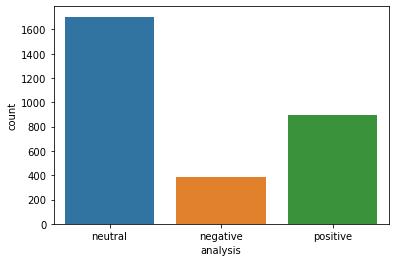

In [332]:
import seaborn as sns 
sns.countplot(x=df_amazon['analysis'],data=df_amazon)

# Analysis of Snapdeal

In [8]:
df_snapdeal=pd.read_csv('Snapdeal.csv')

In [9]:
df_snapdeal.shape

(445, 1)

In [10]:
df_snapdeal.columns

Index(['Tweet'], dtype='object')

In [11]:
df_snapdeal.drop_duplicates(inplace=True) # Removing the duplicates 

In [12]:
df_snapdeal.shape

(440, 1)

In [13]:
df_snapdeal['tidy_tweet'] =df_snapdeal['Tweet'].apply(cleantext)

In [14]:
wordnet_lemmatizer = WordNetLemmatizer()
def final_clean(text):
    text=text.split()
    text= [w for w in text if not w in stopwords.words('english')]
    text= [wordnet_lemmatizer.lemmatize(w,'v') for w in text]
    return text

In [15]:
df_snapdeal['tidy_tweet'] =df_snapdeal['tidy_tweet'].apply(final_clean)

In [16]:
df_snapdeal['tidy_tweet'] = df_snapdeal['tidy_tweet'].apply(lambda x: ' '.join([w for w in x]))

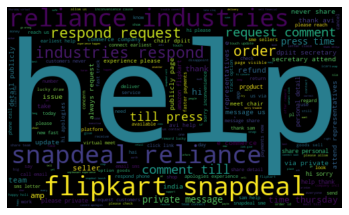

In [17]:
# Plot the word Cloud 
allwords=' '.join([i for i in df_snapdeal['tidy_tweet']])
wordCloud=WordCloud(width=500,height=300,random_state=21,max_font_size=300).generate(allwords)

plt.imshow(wordCloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [23]:
# Create a function to get the subjectivity 
def getsubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

# create a function to get the polarity
def getpolarity(text):
    return TextBlob(text).sentiment.polarity

# Create two new columns 
df_snapdeal['Subjectivity']=df_snapdeal['tidy_tweet'].apply(getsubjectivity)
df_snapdeal['Polarity']=df_snapdeal['tidy_tweet'].apply(getpolarity)
# show the data frame with new columns 
df_snapdeal

,Tweet,tidy_tweet,Subjectivity,Polarity
0,@shidra1987 I've shared this with my team. I'll update you soon on this. Thanks! Sam,share team update soon thank sam,0.000000,0.000000
1,"@Snapdeal_Help Any update from Amaze Couriers till now,\nAre they going to deliver or refund will be initiated.\nTry… https://t.co/utPAehy7Sd",help update amaze couriers till go deliver refund initiate try,0.000000,0.000000
2,Order GUess watch from @amazon worth rupees 5949\ngot this from the package. Can you suggest what should be the nex… https://t.co/AZkLJem7Av,order guess watch worth rupees 5949 get package suggest nex,0.100000,0.300000
3,"@neerajs91844772 Hi! Apologies for the inconvenience. Do reach out to us via ""Private Message"" for your request. Ha… https://t.co/QgCN2ytZ89",hi apologies inconvenience reach us via private message request ha,0.375000,0.000000
4,@Snapdeal_Help No refund Received Even after returning the item 4 days back.,help refund receive even return item 4 days back,0.000000,0.000000
5,@snapdeal I'm on leave 🤣🤣,leave,0.000000,0.000000
6,@phat_wangun Thank you for taking out time to write this review. Your kind words encourage us greatly. Happy shopping! Thanks! Avi,wangun thank take time write review kind word encourage us greatly happy shop thank avi,0.950000,0.700000
7,@Snapdeal_Help Thank you snapdeal for super fast delivery and solving my issue.,help thank snapdeal super fast delivery solve issue,0.633333,0.266667
8,Kis kisko lag raha hai ki aaj Monday hai? \n😏 \nComment with 😩 if you are feeling the Monday tension 😋\n#TuesdayVibe… https://t.co/vAJ4Fd3rie,kis kisko lag raha hai ki aaj monday hai comment feel monday tension tuesdayvibe,0.000000,0.000000
9,@Sagarth69534321 Hi! Thanks for showing your interest in shopping with us. You can shop with us from our website… https://t.co/QNwzfNuarx,hi thank show interest shop us shop us website,0.000000,0.000000


In [24]:
def getAnalysis(score):
    if score<0:
        return 'negative'
    elif score==0:
        return'neutral'
    else:
        return 'positive'
    
df_snapdeal['analysis']=df_snapdeal['Polarity'].apply(getAnalysis)
df_snapdeal

,Tweet,tidy_tweet,Subjectivity,Polarity,analysis
0,@shidra1987 I've shared this with my team. I'll update you soon on this. Thanks! Sam,share team update soon thank sam,0.000000,0.000000,neutral
1,"@Snapdeal_Help Any update from Amaze Couriers till now,\nAre they going to deliver or refund will be initiated.\nTry… https://t.co/utPAehy7Sd",help update amaze couriers till go deliver refund initiate try,0.000000,0.000000,neutral
2,Order GUess watch from @amazon worth rupees 5949\ngot this from the package. Can you suggest what should be the nex… https://t.co/AZkLJem7Av,order guess watch worth rupees 5949 get package suggest nex,0.100000,0.300000,positive
3,"@neerajs91844772 Hi! Apologies for the inconvenience. Do reach out to us via ""Private Message"" for your request. Ha… https://t.co/QgCN2ytZ89",hi apologies inconvenience reach us via private message request ha,0.375000,0.000000,neutral
4,@Snapdeal_Help No refund Received Even after returning the item 4 days back.,help refund receive even return item 4 days back,0.000000,0.000000,neutral
5,@snapdeal I'm on leave 🤣🤣,leave,0.000000,0.000000,neutral
6,@phat_wangun Thank you for taking out time to write this review. Your kind words encourage us greatly. Happy shopping! Thanks! Avi,wangun thank take time write review kind word encourage us greatly happy shop thank avi,0.950000,0.700000,positive
7,@Snapdeal_Help Thank you snapdeal for super fast delivery and solving my issue.,help thank snapdeal super fast delivery solve issue,0.633333,0.266667,positive
8,Kis kisko lag raha hai ki aaj Monday hai? \n😏 \nComment with 😩 if you are feeling the Monday tension 😋\n#TuesdayVibe… https://t.co/vAJ4Fd3rie,kis kisko lag raha hai ki aaj monday hai comment feel monday tension tuesdayvibe,0.000000,0.000000,neutral
9,@Sagarth69534321 Hi! Thanks for showing your interest in shopping with us. You can shop with us from our website… https://t.co/QNwzfNuarx,hi thank show interest shop us shop us website,0.000000,0.000000,neutral


In [25]:
# print all positive tweets 
j=1
sortedDF=df_snapdeal.sort_values(by=['Polarity'])
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='positive'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1

1)order guess watch worth rupees 5949 get package suggest nex

2)wangun thank take time write review kind word encourage us greatly happy shop thank avi

3)help thank snapdeal super fast delivery solve issue

4)femarelle unstoppable india 100 natural health supplement clinically prove natural ingredient

5)femarelle recharge india 100 natural health supplement clinically prove natural ingredients

6)femarelle rejuvenate first time india 100 natural health supplement clinically prove natural

7)spot dent contest executive spot dent close new nexus 6 phone wh

8)sir forever commit mission provide great quality products amp value cus

9)snapdeal roll fast track payments sellers

10)classy stylish fashionable one available tuesday sandals

11)snapdeal sme sellers get faster payments new fast track option goods sell financial expres

12)happy holi

13)happy holi

14)data anecdotally look resume popular indian startups flipkart

15)hi please respond phone call email sms letter claim offer re

KeyError: 175

In [26]:
# print the naegative tweets 
j=1
sortedDF=df_snapdeal.sort_values(by=['Polarity'],ascending=False)
for i in range (0, sortedDF.shape[0]):
    if(sortedDF['analysis'][i]=='negative'):
        print(str(j)+')'+sortedDF['tidy_tweet'][i])
        print()
        j=j+1

1)famaya combo 5 leggings gilrs green 100 cotton 5 6 years 737 snapdeal material cotton

2)help dear long take refund days ago get call regard still wait refund

3)service worst place order 21 flipkart snapdeal snapdeal deliver

4)sorry experience understand concern work closely

5)worst shop app use amazon take money never deliver time delive

6)worst ecommerce websites totally fraud india flipkart paytm snapdeal

7)start tweet cite past experience none indian digital products disappoint fa

8)k verma hi sorry inconvenience note order id get check amp connect thank sam

9)people please understand name container ship evergiven evergreen marine taiwanese firm th

10)truly apologize unpleasant experience get touch shortly please gr

11)help please ask team process refund thank pathetic service

12)hi sorry inconvenience cause team work concern update soon thank shreya

13)help still nothing do feel ashamed chase every single day

14)people legit mad cancel local app call snapdeal across 

KeyError: 175

<AxesSubplot:xlabel='analysis', ylabel='count'>

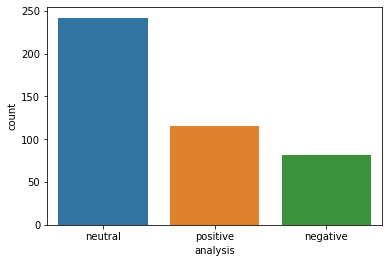

In [27]:
import seaborn as sns 
sns.countplot(x=df_snapdeal['analysis'],data=df_flipkart)